In [ ]:
# !unzip "drive/MyDrive/TensorFlow/Dog Vision/dog-breed-identification.zip" -d "drive/MyDrive/TensorFlow/Dog Vision/"

# End-to-end dog breed multi-class classification

This notebook builds an end-to-end multi-class image classifier using TensorFlow 2.0 and TensorFlow Hub.

## 1. Problem:

Identifying the breed of a dog given an image of a dog. 

When I'm sitting at the cafe and I take a photo of a dog, I want to know what breed of dog it is.

## 2. Data:

The data we're using is from Kaggle's dog breed identification competition. Here's the link: 

https://www.kaggle.com/c/dog-breed-identification

## 3. Evaluation:

The evaluation is a file with prediction probabilities for each dog breed of each test image.

## 4. Features:

* 120 different breeds of dogs (classes)
* Dealing with images (unstructured data) so we are using deep learning and transfer learning
* About 10k training images (with labels)
* About 10k testing images

# Get Our Workspace Ready

In [3]:
# Import TensorFlow into Colab
import tensorflow as tf
print('TF Version:', tf.__version__)

TF Version: 2.9.2


In [4]:
# Import TensorFlow Hub
import tensorflow_hub as hub
print('TF Hub Version: ', hub.__version__)

TF Hub Version:  0.12.0


In [5]:
# Check for GPU availability
print(tf.config.list_physical_devices('GPU'))

[PhysicalDevice(name='/physical_device:GPU:0', device_type='GPU')]


# Getting Our Data Ready

With all machine learning models, our data has to be in numerical format. So that's what we'll be doing first - turning our images into tensors.

## Accessing Our Labels

In [6]:
# Read CSV and sample data
import pandas as pd
labels_csv = pd.read_csv('/content/drive/MyDrive/TensorFlow/Dog Vision/labels.csv')
labels_csv.head()

,id,breed
0,000bec180eb18c7604dcecc8fe0dba07,boston_bull
1,001513dfcb2ffafc82cccf4d8bbaba97,dingo
2,001cdf01b096e06d78e9e5112d419397,pekinese
3,00214f311d5d2247d5dfe4fe24b2303d,bluetick
4,0021f9ceb3235effd7fcde7f7538ed62,golden_retriever


In [7]:
# Describe our DataFrame
labels_csv.describe()

,id,breed
count,10222,10222
unique,10222,120
top,000bec180eb18c7604dcecc8fe0dba07,scottish_deerhound
freq,1,126


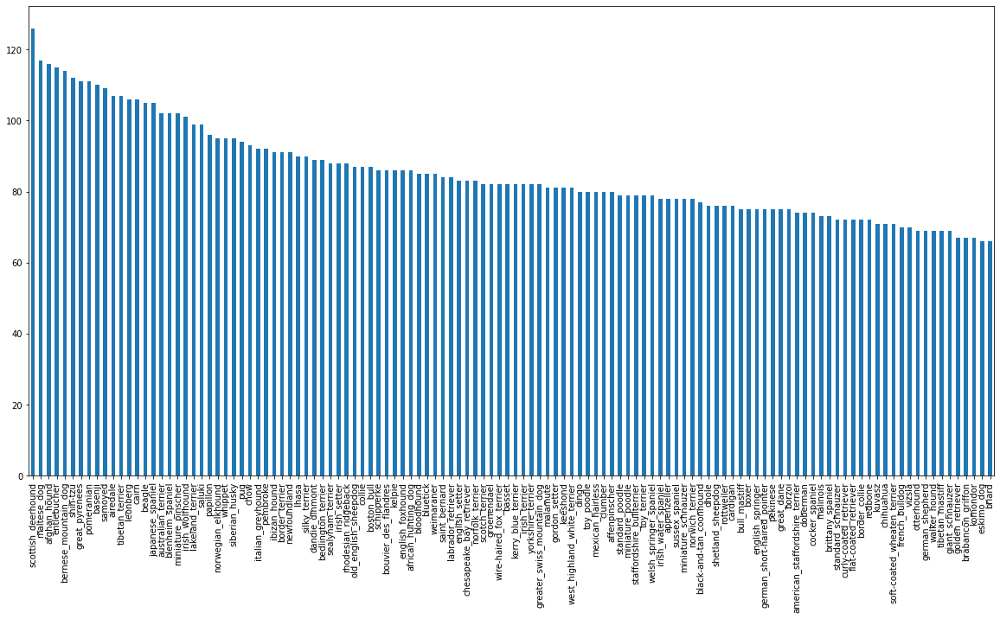

In [8]:
# How many images are there of each breed?
labels_csv['breed'].value_counts().plot(kind='bar',figsize=(20,10));

In [9]:
# Average dog breed count
labels_csv.breed.value_counts().mean()

85.18333333333334

This article: https://cloud.google.com/vision/automl/object-detection/docs/prepare recommends using at least 10 images per label/class. However - for the best performance - it's good to use around 100 or more.

## Accessing Our Images

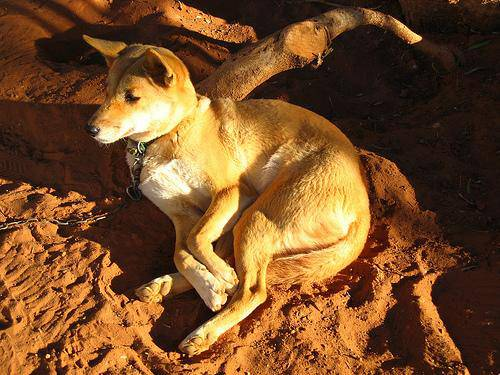

In [10]:
# One way to view an image
from IPython.display import Image
Image('drive/MyDrive/TensorFlow/Dog Vision/train/001513dfcb2ffafc82cccf4d8bbaba97.jpg')

In [11]:
# Create filenames list
filenames = [fname for fname in labels_csv['id']]

In [12]:
# Check the first 10
filenames[:10]

['000bec180eb18c7604dcecc8fe0dba07',
 '001513dfcb2ffafc82cccf4d8bbaba97',
 '001cdf01b096e06d78e9e5112d419397',
 '00214f311d5d2247d5dfe4fe24b2303d',
 '0021f9ceb3235effd7fcde7f7538ed62',
 '002211c81b498ef88e1b40b9abf84e1d',
 '00290d3e1fdd27226ba27a8ce248ce85',
 '002a283a315af96eaea0e28e7163b21b',
 '003df8b8a8b05244b1d920bb6cf451f9',
 '0042188c895a2f14ef64a918ed9c7b64']

In [13]:
# Finalize filenames list 
filenames = ['drive/MyDrive/TensorFlow/Dog Vision/train/' + fname + '.jpg' for fname in labels_csv['id']]

In [14]:
# Check the first 10 
filenames[:10]

['drive/MyDrive/TensorFlow/Dog Vision/train/000bec180eb18c7604dcecc8fe0dba07.jpg',
 'drive/MyDrive/TensorFlow/Dog Vision/train/001513dfcb2ffafc82cccf4d8bbaba97.jpg',
 'drive/MyDrive/TensorFlow/Dog Vision/train/001cdf01b096e06d78e9e5112d419397.jpg',
 'drive/MyDrive/TensorFlow/Dog Vision/train/00214f311d5d2247d5dfe4fe24b2303d.jpg',
 'drive/MyDrive/TensorFlow/Dog Vision/train/0021f9ceb3235effd7fcde7f7538ed62.jpg',
 'drive/MyDrive/TensorFlow/Dog Vision/train/002211c81b498ef88e1b40b9abf84e1d.jpg',
 'drive/MyDrive/TensorFlow/Dog Vision/train/00290d3e1fdd27226ba27a8ce248ce85.jpg',
 'drive/MyDrive/TensorFlow/Dog Vision/train/002a283a315af96eaea0e28e7163b21b.jpg',
 'drive/MyDrive/TensorFlow/Dog Vision/train/003df8b8a8b05244b1d920bb6cf451f9.jpg',
 'drive/MyDrive/TensorFlow/Dog Vision/train/0042188c895a2f14ef64a918ed9c7b64.jpg']

In [15]:
# Check whether our image files align with kaggles original data
import os
len(os.listdir('drive/MyDrive/TensorFlow/Dog Vision/train/'))

10222

In [16]:
# Check whether our image files align with kaggles original data
len(filenames)

10222

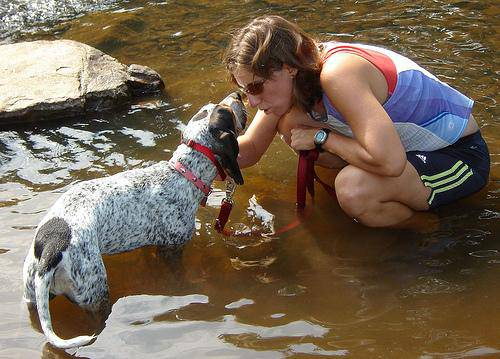

In [17]:
# View a random image in our files list
Image(filenames[3456])

## Creating Our Labels

In [18]:
# One method
import numpy as np
labels = labels_csv['breed'].to_numpy()
labels

array(['boston_bull', 'dingo', 'pekinese', ..., 'airedale',
       'miniature_pinscher', 'chesapeake_bay_retriever'], dtype=object)

In [19]:
# Unique labels
unique_breeds = np.unique(labels)

In [20]:
# Turn a single label into an array of booleans
print(labels[0])
labels[0] == unique_breeds

boston_bull


array([False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False,  True, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False])

In [21]:
# Turn every label into a boolean array
boolean_labels = [label == unique_breeds for label in labels]
boolean_labels

[array([False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False,  True, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False]),
 array([False, False, False, False, False, Fal

In [22]:
# Confirm the length
len(boolean_labels)

10222

In [23]:
# Example 1: Turning boolean array into integers
print(labels[0]) # Original label
print(np.where(unique_breeds == labels[0])) # Index where label occurs
print(boolean_labels[0].argmax()) # Index
print(boolean_labels[0].astype(int)) # There will be a 1 where the sample label occurs

boston_bull
(array([19]),)
19
[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0]


In [24]:
# Example 2: Turning boolean array into integers
print(labels[2]) # Original label
print(np.where(unique_breeds == labels[2])) # Index where label occurs
print(boolean_labels[2].argmax()) # Index
print(boolean_labels[2].astype(int)) # There will be a 1 where the sample label occurs

pekinese
(array([85]),)
85
[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0]


## Creating Our Own Validation Set

Kaggle only provides a training and test set - so we're going to build a validation set out of the provided training set.

In [25]:
# Set up x and y variables
x = filenames
y = boolean_labels

We're going to start off experimenting with ~1000 images and increase as needed.

In [26]:
NUM_IMAGES = 1000 #@param {type:"slider", min:1000, max:10000, step:1000}

In [27]:
# Split data into train and validation sets
from sklearn.model_selection import train_test_split

# Split them into training and validation of total size NUM_IMAGES
x_train, x_val, y_train, y_val = train_test_split(x[:NUM_IMAGES],
                                                  y[:NUM_IMAGES],
                                                  test_size=0.2,
                                                  random_state=42)

# Confirm
len(x_train), len(x_val), len(y_train), len(y_val)

(800, 200, 800, 200)

In [28]:
# Sample the training data

x_train[:2], y_train[:2]

(['drive/MyDrive/TensorFlow/Dog Vision/train/00bee065dcec471f26394855c5c2f3de.jpg',
  'drive/MyDrive/TensorFlow/Dog Vision/train/0d2f9e12a2611d911d91a339074c8154.jpg'],
 [array([False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False,  True,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, Fa

## Preprocessing Our Images

Now we need to turn our images into Tensors using TensorFlow.

To preprocess our images inteo Tesnors we're going to write a function which does a few things:

1. Take an image filepath as input
2. Use TensorFlow to read the file and save it to a variable, `image`
3. Turn our `image` (a jpg) into Tensors
4. Normalize our images (convert color channel values from 0-255 to 0-1)
5. Resize the `image` to be a shape of (224,244)
6. Return the modified `image`

In [29]:
# Convert one image to a numpy array

from matplotlib.pyplot import imread

image = imread(filenames[42])
image.shape

(257, 350, 3)

In [30]:
# RBG Pixel values between 0 and 255

image.max(), image.min()

(255, 0)

Refresher on NumPy arrays:

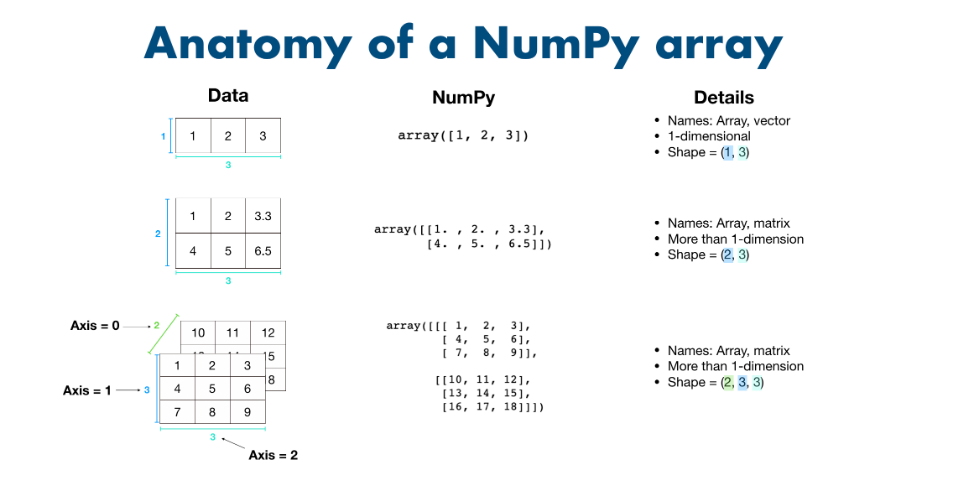

In [31]:
# Create a tensor

tf.constant(image)[:2]

<tf.Tensor: shape=(2, 350, 3), dtype=uint8, numpy=
array([[[ 89, 137,  87],
        [ 76, 124,  74],
        [ 63, 111,  59],
        ...,
        [ 76, 134,  86],
        [ 76, 134,  86],
        [ 76, 134,  86]],

       [[ 72, 119,  73],
        [ 67, 114,  68],
        [ 63, 111,  63],
        ...,
        [ 75, 131,  84],
        [ 74, 132,  84],
        [ 74, 131,  86]]], dtype=uint8)>

In [32]:
# Demonstrate numpy array

image[:2]

array([[[ 89, 137,  87],
        [ 76, 124,  74],
        [ 63, 111,  59],
        ...,
        [ 76, 134,  86],
        [ 76, 134,  86],
        [ 76, 134,  86]],

       [[ 72, 119,  73],
        [ 67, 114,  68],
        [ 63, 111,  63],
        ...,
        [ 75, 131,  84],
        [ 74, 132,  84],
        [ 74, 131,  86]]], dtype=uint8)

The tensor allows us to use our GPU. But it follows the same structure as a numpy array.

In [33]:
# Define Image Size
IMG_SIZE = 224

# Create a function for preprocessing images
def process_image(image_path, img_size=IMG_SIZE):
  """
  Take an image file path and transforms into a Tensor.
  """
  # Read in an image file
  image = tf.io.read_file(image_path)

  # Turn jpeg image into numerical Tensor with 3 color channels (RBG)
  image = tf.image.decode_jpeg(image, channels=3)

  # Convert the color channel values from 0-255 to 0-1 values
  image = tf.image.convert_image_dtype(image, tf.float32)
  
  # Resize the image to our desired value (244,244)
  image = tf.image.resize(image, size=[IMG_SIZE,IMG_SIZE])

  return image

## Turning Our Data Into Batches

Why turn our data into batches?

Let's say you're trying to process 10,000+ images in one go.. they all might not fit into memory.

So that's why we do about 32 images at a time (you can manually adjust the batch size if need be).

In order to use TensorFlow effectively, we need our data in the form of Tensor tuples which look like this:

`(image, label)`

In [34]:
# Create a simple function to return a tuple (image, label)

def get_image_label(image_path, label):
  """
  Takes an image file path name and the associated label,
  processes the image and returns a tuple of (image,label)
  """
  image = process_image(image_path)
  return image,label

In [35]:
# Demo of the above
get_image_label(x[42],y[42])

(<tf.Tensor: shape=(224, 224, 3), dtype=float32, numpy=
 array([[[0.3264178 , 0.5222886 , 0.3232816 ],
         [0.2537167 , 0.44366494, 0.24117757],
         [0.25699762, 0.4467087 , 0.23893751],
         ...,
         [0.29325107, 0.5189916 , 0.3215547 ],
         [0.29721776, 0.52466875, 0.33030328],
         [0.2948505 , 0.5223015 , 0.33406618]],
 
        [[0.25903144, 0.4537807 , 0.27294815],
         [0.24375686, 0.4407019 , 0.2554778 ],
         [0.2838985 , 0.47213382, 0.28298813],
         ...,
         [0.2785345 , 0.5027992 , 0.31004712],
         [0.28428748, 0.5108719 , 0.32523635],
         [0.28821915, 0.5148036 , 0.32916805]],
 
        [[0.20941195, 0.40692952, 0.25792548],
         [0.24045378, 0.43900946, 0.2868911 ],
         [0.29001117, 0.47937486, 0.32247734],
         ...,
         [0.26074055, 0.48414773, 0.30125174],
         [0.27101526, 0.49454468, 0.32096273],
         [0.27939945, 0.5029289 , 0.32934693]],
 
        ...,
 
        [[0.00634795, 0.03442048

In [36]:
# Define the batch size, 32 is a good default
BATCH_SIZE = 32

# Create a function to turn data into batches
def create_data_batches(x, y=None, batch_size=BATCH_SIZE, valid_data=False, test_data=False):
  """
  Creates batches of data out of image (x) and label (y) pairs.
  Shuffles the data if it's training data but doesn't shuffle it if it's validation data.
  Also accepts test data as input (no labels).
  """
  # If the data is a test dataset, we probably don't have labels
  if test_data:
    print("Creating test data batches...")
    data = tf.data.Dataset.from_tensor_slices((tf.constant(x))) # only filepaths
    data_batch = data.map(process_image).batch(BATCH_SIZE)
    return data_batch
  
  # If the data if a valid dataset, we don't need to shuffle it
  elif valid_data:
    print("Creating validation data batches...")
    data = tf.data.Dataset.from_tensor_slices((tf.constant(x), # filepaths
                                               tf.constant(y))) # labels
    data_batch = data.map(get_image_label).batch(BATCH_SIZE)
    return data_batch

  else:
    # If the data is a training dataset, we shuffle it
    print("Creating training data batches...")
    # Turn filepaths and labels into Tensors
    data = tf.data.Dataset.from_tensor_slices((tf.constant(x), # filepaths
                                              tf.constant(y))) # labels
    
    # Shuffling pathnames and labels before mapping image processor function is faster than shuffling images
    data = data.shuffle(buffer_size=len(x))

    # Create (image, label) tuples (this also turns the image path into a preprocessed image)
    data = data.map(get_image_label)

    # Turn the data into batches
    data_batch = data.batch(BATCH_SIZE)
  return data_batch

In [37]:
# Create training and validation data batches
train_data = create_data_batches(x_train, y_train)
val_data = create_data_batches(x_val,y_val,valid_data=True)

Creating training data batches...
Creating validation data batches...


In [38]:
# Check out the different attributes of our data batches
train_data.element_spec, val_data.element_spec

((TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None),
  TensorSpec(shape=(None, 120), dtype=tf.bool, name=None)),
 (TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None),
  TensorSpec(shape=(None, 120), dtype=tf.bool, name=None)))

## Visualizing Data Batches

Our data is now in batches, however, these can be a little hard to understand/comprehend. Let's visualize them.

In [39]:
import matplotlib.pyplot as plt

# Create a function for viewing images in a data batch
def show_25_images(images,labels):
  """
  Displays a plot of 25 images and their labels from a data batch
  """

  # Set up the figure
  plt.figure(figsize=(10,10))

  # Set up 25 subplots
  for i in range(25):
    # Create subplots (5 rows, 5 columns)
    ax = plt.subplot(5,5,i+1)
    # Display an image
    plt.imshow(images[i])
    # Add the image label as the title
    plt.title(unique_breeds[labels[i].argmax()])
    # Turn the grid lines off
    plt.axis('off')

In [40]:
# What kind of object is our train data?
train_data

<BatchDataset element_spec=(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 120), dtype=tf.bool, name=None))>

In [41]:
# Convert batch to np iterator
train_images, train_labels = next(train_data.as_numpy_iterator())

In [42]:
# Confirm
train_images, train_labels

(array([[[[2.97362000e-01, 2.97362000e-01, 2.97362000e-01],
          [2.71604836e-01, 2.71604836e-01, 2.71604836e-01],
          [5.19140244e-01, 5.19140244e-01, 5.19140244e-01],
          ...,
          [2.62210742e-02, 2.62210742e-02, 2.62210742e-02],
          [1.80889815e-02, 1.80889815e-02, 1.80889815e-02],
          [3.60021777e-02, 3.60021777e-02, 3.60021777e-02]],
 
         [[2.55938113e-01, 2.55938113e-01, 2.55938113e-01],
          [2.77904689e-01, 2.77904689e-01, 2.77904689e-01],
          [3.43788981e-01, 3.43788981e-01, 3.43788981e-01],
          ...,
          [2.06511796e-01, 2.06511796e-01, 2.06511796e-01],
          [1.20267168e-01, 1.20267168e-01, 1.20267168e-01],
          [8.90239030e-02, 8.90239030e-02, 8.90239030e-02]],
 
         [[2.46728733e-01, 2.46728733e-01, 2.46728733e-01],
          [3.45740616e-01, 3.45740616e-01, 3.45740616e-01],
          [3.15751970e-01, 3.15751970e-01, 3.15751970e-01],
          ...,
          [1.22781456e-01, 1.22781456e-01, 1.2278

In [43]:
# Confirm batch size
len(train_images), len(train_images)

(32, 32)

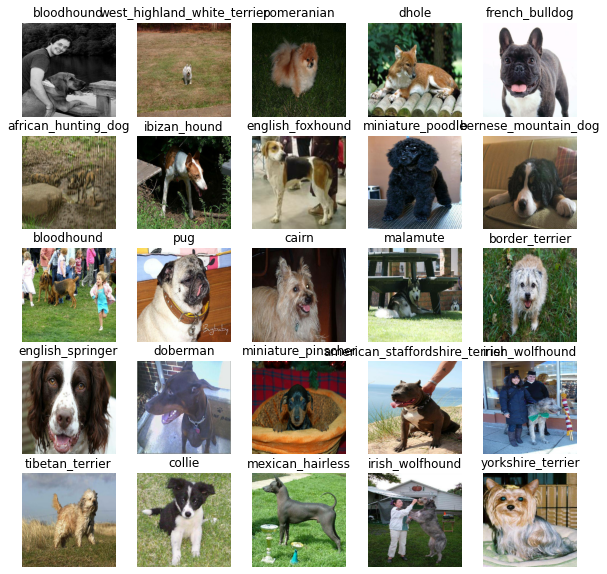

In [44]:
# Now let's visualize the data in one of the training batches
show_25_images(train_images, train_labels)

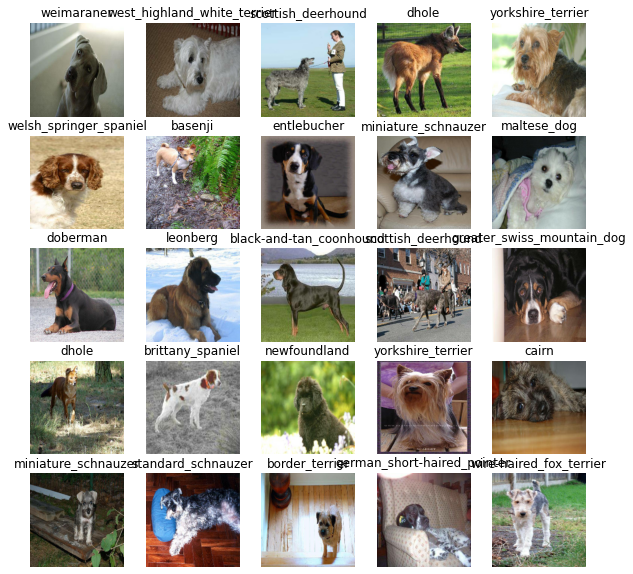

In [45]:
# Run again
train_images, train_labels = next(train_data.as_numpy_iterator())
show_25_images(train_images, train_labels)

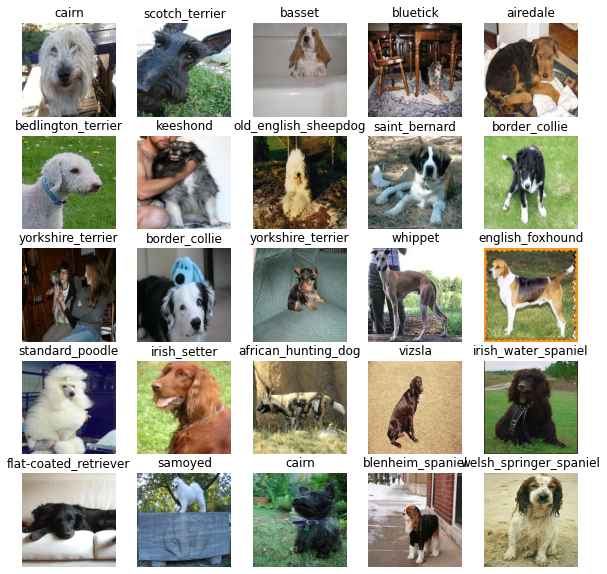

In [46]:
# Now let's visualize our validation set
val_images, val_labels = next(val_data.as_numpy_iterator())
show_25_images(val_images, val_labels)

# Building a model

Before we build a model, there are a few things we need to do define:
* The input shape (our images shape, in the form of Tensors) to our model.
* The output shape (image labels, in the form of Tensors) of our model
* The URL of the model we want to use.

In [47]:
# Setup input shape to the model
INPUT_SHAPE = [None, IMG_SIZE, IMG_SIZE, 3] # Batch, height, width, color channels

In [48]:
# Setup output shape of the model
OUTPUT_SHAPE = len(unique_breeds) #120 unique breeds

In [49]:
# Setup model URL from TensorFlow Hub
MODEL_URL = 'https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/5'

Now that we've got our inputs, outputs and model ready to go, let's
put them together into a Keras deep learning model.

Kera's documentation: https://www.tensorflow.org/guide/keras/sequential_model

Knowing this, let's create a function which:
* Takes the input shape, output shape and the model we've chosen as parameters.
* Defines the layers in a Keras model in sequential fashion (do this,
then this, then this).
* Compiles the model (says how it should be evaluated and improved).
* Builds the model (tells the model the input shape it'll be getting).
* Returns the model.

In [50]:
# Create a function which builds a Keras model
def create_model(input_shape=INPUT_SHAPE, output_shape=OUTPUT_SHAPE, model_url=MODEL_URL):

  print("Building model with: ", model_url)

  # Set up the model layers
  model = tf.keras.Sequential([
      hub.KerasLayer(MODEL_URL), # Layer 1 (input layer)
      tf.keras.layers.Dense(units=OUTPUT_SHAPE,
                            activation="softmax") # Layer 2 (output layer)
  ])

  # Compile the modeel
  model.compile(loss=tf.keras.losses.CategoricalCrossentropy(),
                optimizer=tf.keras.optimizers.Adam(),
                metrics=['accuracy']
  )

  # Build the model
  model.build(INPUT_SHAPE)

  return model

In [51]:
model = create_model()
model.summary()

Building model with:  https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/5
Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 keras_layer (KerasLayer)    (None, 1001)              5432713   
                                                                 
 dense (Dense)               (None, 120)               120240    
                                                                 
Total params: 5,552,953
Trainable params: 120,240
Non-trainable params: 5,432,713
_________________________________________________________________


## Creating callbacks

Callbacks are helper functions a moel can use during training to do such things as save its progress, check its progress, or stop training early if a model stops improving.

There are more use-cases for call-backs, but these are what we're going to implement.

Documentation: https://www.tensorflow.org/api_docs/python/tf/keras/callbacks/TensorBoard

We're going to create two callbacks:
* One for TensorBorad which helps track our models progress
* Another for early stopping which prevents our model from training for too long.

### TensorBoard Callback

To setup a TensorBoard callback, we need to do 3 things:
1. Load the TensorBoard notebook extension
2. Create a TensorBoard callback which is able to save logs to a directory and pass it to our models `fit()` function.
3. Visualize our models training logs with the `%tensorboard` magic function (we'll do this after model training)

In [52]:
# Load TensorBoard notebook extension
%load_ext tensorboard

In [53]:
import datetime

# Create a function to build a TensorBoard callback
def create_tensorboard_callback():
  # Create log directory for storing TensorBoard logs
  logdir = os.path.join('/content/drive/MyDrive/TensorFlow/Dog Vision/logs',
                        # Make it so the logs get tracked whenever we run an experiment
                        datetime.datetime.now().strftime('%Y%m%d-%H%M%S'))
  return tf.keras.callbacks.TensorBoard(logdir)

### EarlyStopping Callback

Early stopping helps stop our model from overfitting by stopping training if a certain evaluation metric stops improving.

Documentation:https://www.tensorflow.org/api_docs/python/tf/keras/callbacks/EarlyStopping

In [54]:
# Create early stopping callback
early_stopping = tf.keras.callbacks.EarlyStopping(monitor="val_accuracy",
                                                  patience=3)

# Training a model (on a subset of data)

Our first model is only going to train on 1000 images to make sure everything is working. We are trying to minimize the time between experiments. 

In [55]:
NUM_EPOCHS = 100 #@param {type:"slider", min:10, max:100}

In [56]:
# Check for GPU availability
print(tf.config.list_physical_devices('GPU'))

[PhysicalDevice(name='/physical_device:GPU:0', device_type='GPU')]


## Creating a function to train a model

* Create a model using `create_model()`
* Setup a Tensorboard callback using `create_tensorboard_callback()`
* Call the `fit()` functino on our model - passing it the training date, validation data, number of epochs to train for (`NUM_EPOCHS`) and the callbacks we'd like to use 
* Return the model

In [57]:
# Build a function to train and return a trained model
def train_model():
  """
  Trains a given model and returns the trained version.
  """
  # Create a model
  model = create_model()

  # Create new TensorBoard session every time we train a model
  tensorboard = create_tensorboard_callback()

  # Fit the model to the data - passing it the callbacks we created
  model.fit(x=train_data,
            epochs=NUM_EPOCHS,
            validation_data=val_data,
            validation_freq=1,
            callbacks=[tensorboard,early_stopping])
  
  # Return the fitted model
  return model

In [ ]:
# Fit the model to the data
model = train_model()

Building model with:  https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/5
Epoch 1/100
25/25 [==============================] - 213s 8s/step - loss: 4.5887 - accuracy: 0.0875 - val_loss: 3.4833 - val_accuracy: 0.2650
Epoch 2/100
25/25 [==============================] - 4s 139ms/step - loss: 1.6147 - accuracy: 0.6925 - val_loss: 2.2498 - val_accuracy: 0.5300
Epoch 3/100
25/25 [==============================] - 4s 178ms/step - loss: 0.5426 - accuracy: 0.9438 - val_loss: 1.8022 - val_accuracy: 0.6000
Epoch 4/100
25/25 [==============================] - 5s 177ms/step - loss: 0.2480 - accuracy: 0.9887 - val_loss: 1.6004 - val_accuracy: 0.6350
Epoch 5/100
25/25 [==============================] - 4s 166ms/step - loss: 0.1453 - accuracy: 0.9975 - val_loss: 1.5117 - val_accuracy: 0.6550
Epoch 6/100
25/25 [==============================] - 3s 139ms/step - loss: 0.0997 - accuracy: 1.0000 - val_loss: 1.4688 - val_accuracy: 0.6600
Epoch 7/100
25/25 [==============================

**Question:** It looks like our model is overfitting because it's performing far better on the training dataset than the validation dataset. What are some ways to prevent model overfitting in deep learning neural networks?

**Note:** Overfitting to begin with is a good thing. It means the model is learning.

## Checking the TensorBoard logs

The TensorBoard magic function (`%tensorboard`) will access the logs directory we created earlier and visualize it's contents.

In [58]:
%tensorboard --logdir /content/drive/MyDrive/TensorFlow/Dog\ Vision/logs

<IPython.core.display.Javascript object>

# Making and Evaluating Predictions Using a Trained Model

In [ ]:
# Review validation data
val_data

<BatchDataset element_spec=(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 120), dtype=tf.bool, name=None))>

In [ ]:
# Make predictions on the validation data (not used to train on)
predictions = model.predict(val_data,
                            verbose=1)

predictions

7/7 [==============================] - 1s 149ms/step


array([[2.47111195e-04, 2.29477100e-05, 1.29893728e-04, ...,
        8.36237887e-05, 2.31188897e-05, 1.35655212e-03],
       [2.30704565e-04, 2.25733267e-04, 2.73286307e-04, ...,
        2.25689568e-04, 3.57082055e-04, 2.07255052e-05],
       [9.36697961e-06, 4.36337228e-04, 6.26702313e-05, ...,
        1.50665524e-03, 2.46023468e-04, 5.24374773e-04],
       ...,
       [1.75451578e-06, 7.34827699e-06, 1.22812162e-05, ...,
        3.82738290e-06, 4.45281739e-06, 2.74405488e-06],
       [3.55563709e-03, 2.95131147e-04, 1.17705305e-04, ...,
        7.68725149e-05, 2.04335101e-05, 4.52416437e-03],
       [2.21313778e-04, 5.53197879e-06, 1.11667765e-03, ...,
        1.19621656e-03, 7.83206604e-04, 3.23185523e-05]], dtype=float32)

In [ ]:
# Shape of predictions
predictions.shape

(200, 120)

In [ ]:
# One example
predictions[0]

array([2.47111195e-04, 2.29477100e-05, 1.29893728e-04, 5.00851820e-05,
       1.69218620e-04, 2.01948878e-05, 2.39746831e-03, 1.64885554e-04,
       6.46904300e-05, 2.73834215e-04, 4.45185462e-04, 1.48505598e-04,
       1.26022846e-04, 1.37180659e-05, 5.56761333e-05, 4.87977923e-05,
       1.91784657e-05, 3.04238647e-01, 3.37902202e-05, 6.57691135e-06,
       2.77915533e-04, 7.84640652e-05, 4.26689585e-05, 4.66041412e-04,
       6.80928224e-06, 4.10577661e-04, 1.46738291e-01, 3.60697377e-05,
       1.48341031e-04, 1.37665513e-04, 3.33161042e-05, 1.27883267e-03,
       3.37906415e-04, 1.47010787e-05, 1.87903919e-04, 7.14378152e-03,
       6.37510220e-06, 1.52146866e-04, 2.51967576e-05, 4.41722477e-05,
       6.89040462e-05, 8.68586267e-06, 2.10192575e-05, 5.65252449e-05,
       1.06690914e-05, 3.30223957e-05, 3.08314047e-05, 5.24122370e-05,
       9.43567866e-05, 8.76315389e-05, 3.31366900e-05, 1.03416314e-04,
       2.43173723e-04, 1.15277850e-04, 2.29309935e-05, 1.74290835e-05,
      

In [ ]:
# Number of predictions
len(predictions)

200

In [ ]:
# Demonstrating softmax
np.sum(predictions[0])

0.99999994

In [ ]:
# First prediction
index = 1
print(predictions[index])
print(f'\nMax value of predictions:{np.max(predictions[index])}')
print(f'\nSum: {np.sum(predictions[index])}')
print(f'Max Index: {np.argmax(predictions[index])}')
print(f'Predicted Label: {unique_breeds[np.argmax(predictions[index])]}')


[2.30704565e-04 2.25733267e-04 2.73286307e-04 8.93152173e-05
 6.20992068e-05 1.03716657e-05 2.29554018e-03 8.28333432e-05
 1.83550920e-03 1.16249852e-04 3.12651653e-04 2.67695987e-06
 1.96743622e-05 6.33724903e-06 1.07059286e-05 3.97402328e-05
 1.96415465e-03 2.47079333e-05 7.99804093e-06 2.81555345e-04
 1.20323464e-04 4.95501672e-06 1.12469344e-04 3.49031652e-05
 7.60909825e-05 3.79639445e-04 2.81705372e-02 7.82458519e-04
 1.51241820e-05 2.12154686e-04 8.65975817e-05 3.78733057e-05
 2.67846131e-04 8.60061334e-07 1.99197984e-05 3.61491460e-04
 4.19229655e-05 1.80928095e-04 9.96027957e-05 1.57578270e-05
 2.88534065e-05 2.83130794e-04 9.43152008e-06 5.44417126e-04
 6.04092958e-04 6.81718171e-04 2.51117861e-04 3.42410749e-05
 9.89591144e-03 1.24147075e-04 2.26693919e-06 1.51736269e-04
 1.62567630e-05 1.53827830e-04 2.33969404e-04 6.48965244e-04
 5.56137729e-06 1.07281096e-02 5.27225202e-05 2.19115187e-04
 3.89582128e-04 4.20676599e-07 6.30561044e-06 3.07489609e-05
 1.27771043e-03 6.675444

Having the above functionality is great, but we want to be able to do it at scale.

And it would be *even better* if we could see the image the prediction is being made on.

**NOTE:** Prediction probabilities are also known as confidence levels.

In [59]:
# Turn prediction probabilities into their respective label (easier to understand)

def get_pred_label(prediction_probabilities):
  """
  Turns an array of prediction probabilities into a label.
  """
  return unique_breeds[np.argmax(prediction_probabilities)]

In [ ]:
# Get a predicted label based on an array of prediction probabilities
pred_label = get_pred_label(predictions[1])
pred_label

Since our validation data is still in a batched dataset - we'll have to unbatch it in order to make predictions on the validation images and then compare those predictions to the validation labels (truth labels).

In [60]:
# Create a function to unbatch a batch dataset
def unbatchify(data):
  """
  Takes a batched dataset of (image, label) Tensors and reutrns separate arrays
  of images and labels.
  """
  images = []
  labels = []
  # Loop through unbatched data
  for image, label in data.unbatch().as_numpy_iterator():
    images.append(image)
    labels.append(unique_breeds[np.argmax(label)])
  return images, labels

In [ ]:
# Unbatchify the validation data
val_images, val_labels = unbatchify(val_data)
val_images[0], val_labels[0]

Now we've got ways to get:

* Prediction labels
* Validation labels
* Validation images

Let's make some function to make these all more visual.

We'll create a function which:

* Takes an array of prediction probabilities, an array of truth labels and an array of images and integers.
* Convert the prediction probabilities to a predicted label.
* Plot the predicted label, its predicted probability, the truth label *and* the target image on a single plot.

In [61]:
def plot_pred(prediction_probabilities, labels, images, n=1):
  """
  View the prediction, ground truth and image for sample n
  """
  pred_prob, true_label, image = prediction_probabilities[n], labels[n], images[n]

  # Get the pred label
  pred_label = get_pred_label(pred_prob)

  # Plot image & remove ticks
  plt.imshow(image)
  plt.xticks([])
  plt.yticks([])

  # Change the colour of the title depending on if the prediction is right or wrong
  if pred_label == true_label:
    color = "green"
  else:
    color = "red"
  
  # Change plot title to be predicted, probability of prediction and truth label
  plt.title("{} {:2.0f}% {}".format(pred_label,
                                    np.max(pred_prob)*100,
                                    true_label),
                                    color=color)

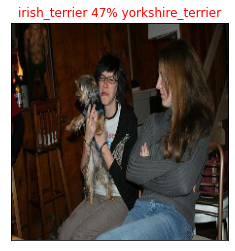

In [ ]:
plot_pred(prediction_probabilities=predictions,
          labels=val_labels,
          images=val_images,
          n=10)

Now that we've got a function to visualize our models top prediction, let's make another function that views our models top 10 predictions.

The function will:

* Take an input of prediction probabilities array and a ground truth array and an integer
* Find the prediction using `get_pred_label()`
* Find the top 10:
  * Prediction probabilities indexes
  * Prediction probabilities values
  * Prediction labels
* Plot the top 10 prediction probability value and labels, coloring the true label green

In [62]:
def plot_pred_conf(prediction_probabilities, labels, n=1):
  """
  Plus the top 10 highest prediction confidences along with the truth label for sample n.
  """
  pred_prob, true_label = prediction_probabilities[n], labels[n]

  # Get the predicted label
  pred_label = get_pred_label(pred_prob)

  # Find the top 10 prediction confidence indexes
  top_10_pred_indexes = pred_prob.argsort()[-10:][::-1]
  # Find the top 10 prediction confidence values
  top_10_pred_values = pred_prob[top_10_pred_indexes]
  # Find the top 10 prediction labels
  top_10_pred_labels = unique_breeds[top_10_pred_indexes]

  # Setup plot
  top_plot = plt.bar(np.arange(len(top_10_pred_labels)),
                     top_10_pred_values,
                     color="grey")
  plt.xticks(np.arange(len(top_10_pred_labels)),
             labels=top_10_pred_labels,
             rotation="vertical")
  
  # Change color of true label
  if np.isin(true_label, top_10_pred_labels):
    top_plot[np.argmax(top_10_pred_labels == true_label)].set_color("green")
  else:
    pass

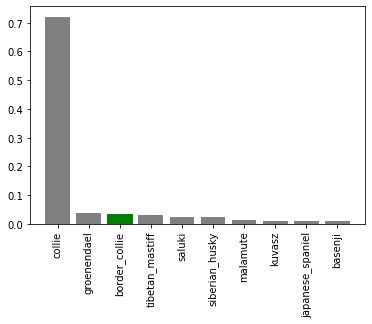

In [ ]:
plot_pred_conf(prediction_probabilities=predictions,
               labels=val_labels,
               n=9)

Now we've got some function to help us visualize our predictions and evaluate our modle, let's check out a few.

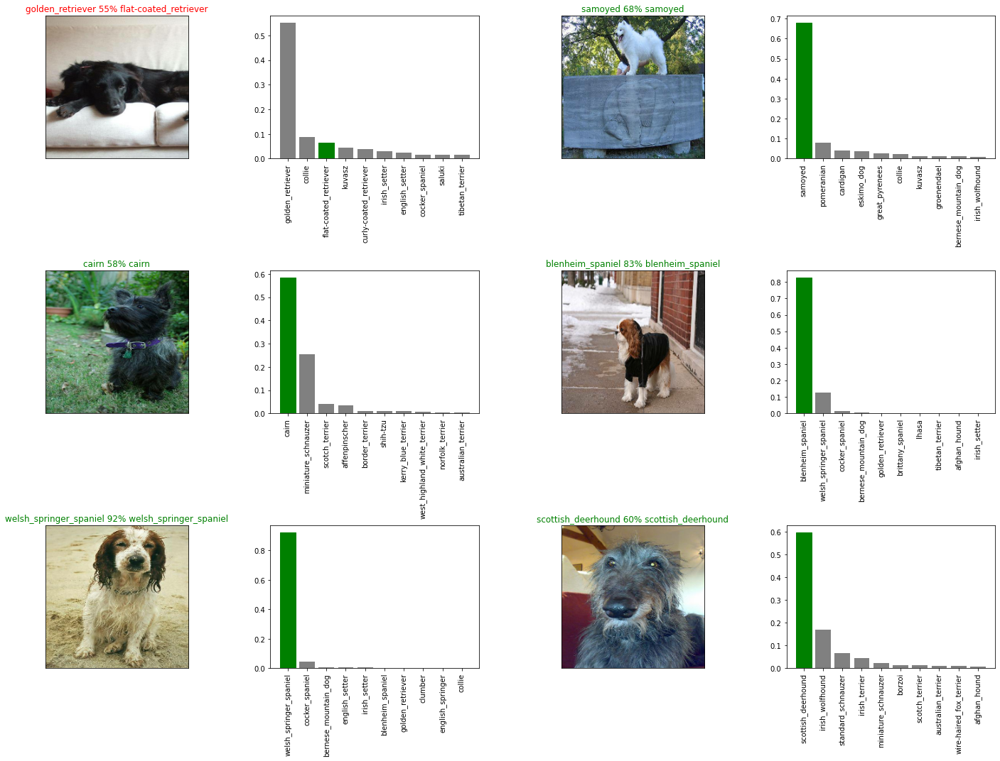

In [ ]:
# Let's check out a few predictions and their different values
i_multiplier = 20
num_rows = 3
num_cols = 2
num_images = num_rows*num_cols
plt.figure(figsize=(10*num_cols, 5*num_rows))
for i in range(num_images):
  plt.subplot(num_rows, 2*num_cols, 2*i+1)
  plot_pred(prediction_probabilities=predictions,
            labels=val_labels,
            images=val_images,
            n=i+i_multiplier)
  plt.subplot(num_rows, 2*num_cols, 2*i+2)
  plot_pred_conf(prediction_probabilities=predictions,
                 labels=val_labels,
                 n=i+i_multiplier)
plt.tight_layout(h_pad=1.0)
plt.show()

# Saving and Reloading a Trained Model

In [63]:
# Create a function to save a model
def save_model(model, suffix=None):
  """
  Saves a given model in a models directory and appends a suffix (string).
  """
  # Create a model directory pathname with current time
  modeldir = os.path.join("/content/drive/MyDrive/TensorFlow/Dog Vision/models",
                          datetime.datetime.now().strftime("%Y%m%d-%H%M%s"))
  model_path = modeldir + "-" + suffix + ".h5" # save format of model
  print(f"Saving model to: {model_path}...")
  model.save(model_path)
  return model_path

In [64]:
# Create a function to load a trained model
def load_model(model_path):
  """
  Loads a saved model from a specified path.
  """
  print(f"Loading saved model from: {model_path}")
  model = tf.keras.models.load_model(model_path, 
                                     custom_objects={"KerasLayer":hub.KerasLayer})
  return model

Now we've got functions to save and load a trained model, let's make sure they work.

In [ ]:
# Save our model trained on 1000 images
save_model(model, suffix="1000-images-mobilenetv2-Adam")

Saving model to: /content/drive/MyDrive/TensorFlow/Dog Vision/models/20221123-20091669234198-1000-images-mobilenetv2-Adam.h5...


'/content/drive/MyDrive/TensorFlow/Dog Vision/models/20221123-20091669234198-1000-images-mobilenetv2-Adam.h5'

In [65]:
# Load a trained model
loaded_1000_image_model = load_model('/content/drive/MyDrive/TensorFlow/Dog Vision/models/20221123-20091669234198-1000-images-mobilenetv2-Adam.h5')

Loading saved model from: /content/drive/MyDrive/TensorFlow/Dog Vision/models/20221123-20091669234198-1000-images-mobilenetv2-Adam.h5


In [ ]:
# Evaluate the pre-saved model
model.evaluate(val_data)

7/7 [==============================] - 1s 110ms/step - loss: 1.3035 - accuracy: 0.6850


[1.303489327430725, 0.6850000023841858]

In [66]:
# Evaluate the loaded model
loaded_1000_image_model.evaluate(val_data)

7/7 [==============================] - 40s 5s/step - loss: 1.3035 - accuracy: 0.6850


[1.303489327430725, 0.6850000023841858]

Based on the two cells above - we can see that the original model from this session and the saved/loaded model are the same.

# Training a Model on the Full Dataset

In [67]:
# Confirm length of x and y
len(x), len(y)

(10222, 10222)

In [69]:
# Create a databatch with the full data set
full_data = create_data_batches(x,y)

Creating training data batches...


In [70]:
# Confirm
full_data

<BatchDataset element_spec=(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 120), dtype=tf.bool, name=None))>

In [71]:
# Create a model for full model
full_model = create_model()

Building model with:  https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/5


In [72]:
# Create full model callbacks
full_model_tensorboard = create_tensorboard_callback()
# No validation set when training on all the data, so we can't monitor validating accuracy
full_model_early_stopping = tf.keras.callbacks.EarlyStopping(monitor='accuracy',
                                                             patience=3)

**NOTE:** Running the cell below will take a while (around 30 minutes for the first epoch) because the GPU we're using in the runtime has to load all of the images into memory.

In [73]:
# Fit the full model to the full data
full_model.fit(x=full_data,
               epochs=NUM_EPOCHS,
               callbacks=[full_model_tensorboard,
                          full_model_early_stopping])

Epoch 1/100
320/320 [==============================] - 2320s 7s/step - loss: 1.3338 - accuracy: 0.6691
Epoch 2/100
320/320 [==============================] - 37s 116ms/step - loss: 0.4020 - accuracy: 0.8796
Epoch 3/100
320/320 [==============================] - 40s 125ms/step - loss: 0.2356 - accuracy: 0.9378
Epoch 4/100
320/320 [==============================] - 39s 122ms/step - loss: 0.1531 - accuracy: 0.9648
Epoch 5/100
320/320 [==============================] - 41s 127ms/step - loss: 0.1057 - accuracy: 0.9796
Epoch 6/100
320/320 [==============================] - 40s 124ms/step - loss: 0.0767 - accuracy: 0.9862
Epoch 7/100
320/320 [==============================] - 39s 122ms/step - loss: 0.0585 - accuracy: 0.9923
Epoch 8/100
320/320 [==============================] - 40s 126ms/step - loss: 0.0473 - accuracy: 0.9935
Epoch 9/100
320/320 [==============================] - 41s 127ms/step - loss: 0.0366 - accuracy: 0.9970
Epoch 10/100
320/320 [==============================] - 40s 124ms

In [74]:
# Save the fully trained model
save_model(full_model, suffix="full-image-mobilenetv2-Adam")

Saving model to: /content/drive/MyDrive/TensorFlow/Dog Vision/models/20221128-19181669663130-full-image-mobilenetv2-Adam.h5...


'/content/drive/MyDrive/TensorFlow/Dog Vision/models/20221128-19181669663130-full-image-mobilenetv2-Adam.h5'

In [76]:
# Load in the full model
loaded_full_model = load_model(model_path = '/content/drive/MyDrive/TensorFlow/Dog Vision/models/20221128-19181669663130-full-image-mobilenetv2-Adam.h5')

Loading saved model from: /content/drive/MyDrive/TensorFlow/Dog Vision/models/20221128-19181669663130-full-image-mobilenetv2-Adam.h5


# Making Predictions on the Test Dataset

Because the model has been trained on images in the form of Tensor batches, to make predictions on the test data - we'll have to first get it into the same format.

We can use the `create_data_batches()` function we created earlier - which takes a list of filenames as input and converts them into Tensor batches.

Therefore - to make predictions on the test data, we'll have to:
* Get the test image filenames
* Convert the filenames into test data batches using `create_data_batches()` and setting the `test_data` parameter to `True` (since the test data doesn't have any labels)
* Make a predictions array by passing the test data batches to the `predict()` method called on the model.

In [106]:
# Load test image filenames
test_path = '/content/drive/MyDrive/TensorFlow/Dog Vision/test/'
test_filenames = [test_path + fname for fname in os.listdir(test_path)]

# Confirm the first 10
test_filenames[:10]

['/content/drive/MyDrive/TensorFlow/Dog Vision/test/e1c6c50bbaee219e7faf29e9c1c343ca.jpg',
 '/content/drive/MyDrive/TensorFlow/Dog Vision/test/dca9642123204fd3df080147b05e4af3.jpg',
 '/content/drive/MyDrive/TensorFlow/Dog Vision/test/e22db0abd7c039726b9683fc0a372204.jpg',
 '/content/drive/MyDrive/TensorFlow/Dog Vision/test/e520e4cd7608c47cd9017bb87e88f334.jpg',
 '/content/drive/MyDrive/TensorFlow/Dog Vision/test/e2c0a9f66153b81eb27bb1bceb8c18dd.jpg',
 '/content/drive/MyDrive/TensorFlow/Dog Vision/test/e431adb273c1b705e6e85147990f355e.jpg',
 '/content/drive/MyDrive/TensorFlow/Dog Vision/test/e05367db91d0449b2afe76a1b7acc1c8.jpg',
 '/content/drive/MyDrive/TensorFlow/Dog Vision/test/e079440ee0061b92ec22faf17be13908.jpg',
 '/content/drive/MyDrive/TensorFlow/Dog Vision/test/e241e149039740594a6af60dc18b269b.jpg',
 '/content/drive/MyDrive/TensorFlow/Dog Vision/test/e46a2bfb7816324d171c4e07786abc59.jpg']

In [88]:
# Create the test data batch
test_data = create_data_batches(test_filenames,test_data=True)

Creating test data batches...


In [89]:
# Confirm
test_data

<BatchDataset element_spec=TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None)>

**NOTE:** Calling `predict()` on our full model and passing it the test data batch will take a long time to run (about an hour).

In [90]:
# Make predictions on test data batch using the loaded full model
test_predictions = loaded_full_model.predict(test_data,
                                             verbose=1)

324/324 [==============================] - 167s 493ms/step


In [92]:
# Confirm
len(test_predictions)

10357

In [94]:
# Save predictions (NumPy array) to csv file (for access later)
np.savetxt('/content/drive/MyDrive/TensorFlow/Dog Vision/preds_array.csv', test_predictions, delimiter=",")

In [100]:
# Load predictions from csv file
test_predictions_loaded = np.loadtxt('/content/drive/MyDrive/TensorFlow/Dog Vision/preds_array.csv', delimiter=",")

In [101]:
#Confirm
test_predictions_loaded[0], test_predictions_loaded[0].sum()

(array([9.99472201e-01, 5.06512805e-08, 5.38220912e-10, 2.25467843e-12,
        5.56649385e-14, 2.50817097e-12, 4.46791226e-09, 4.63527112e-13,
        4.18182815e-11, 1.95117495e-13, 3.90172833e-12, 8.78347710e-05,
        1.10653854e-15, 1.81600385e-07, 1.48988393e-13, 5.07404535e-11,
        1.93856295e-07, 5.69968002e-08, 3.28749215e-11, 4.34974279e-10,
        2.62088171e-04, 1.30433112e-11, 5.38094902e-09, 1.03312698e-06,
        5.39251749e-13, 6.62248123e-09, 1.88170368e-08, 1.06857370e-11,
        7.89565912e-15, 5.97365446e-09, 1.83925355e-08, 1.48127929e-12,
        1.29177204e-06, 7.99538495e-13, 1.06378927e-10, 6.46935572e-09,
        1.31277511e-14, 4.41526888e-13, 2.35842280e-14, 1.04793741e-15,
        3.64051879e-11, 6.91478905e-12, 5.23769599e-16, 9.66736067e-15,
        4.27374891e-09, 2.43431586e-08, 8.82323988e-12, 2.92378708e-12,
        1.00586533e-06, 3.49635459e-11, 5.79387666e-12, 8.27160199e-14,
        5.97022486e-13, 4.22502519e-11, 1.24959200e-07, 5.774079

In [102]:
# Confirm
test_predictions.shape

(10357, 120)

## Preparing Predictions for Kaggle

Looking at the Kaggle sample submission - it looks like Kaggle wants our models prediction probability outputs in a csv (DataFrame) with an ID and a column for each different dog breed.

To get the data in this format, we'll:
* Create a pandas DataFrame with an ID column as well as a column for each dog breed
* Add data to the ID column by extracting the test image ID's from their filepaths
* Add data (the prediction probabilities) to each  of the dog breed columns
* Export the DataFrame as a CSV to submit it to Kaggle

In [104]:
# Create dataframe with empty columns
preds_df = pd.DataFrame(columns=['id'] + list(unique_breeds))

In [105]:
# Confirm
preds_df.columns

Index(['id', 'affenpinscher', 'afghan_hound', 'african_hunting_dog',
       'airedale', 'american_staffordshire_terrier', 'appenzeller',
       'australian_terrier', 'basenji', 'basset',
       ...
       'toy_poodle', 'toy_terrier', 'vizsla', 'walker_hound', 'weimaraner',
       'welsh_springer_spaniel', 'west_highland_white_terrier', 'whippet',
       'wire-haired_fox_terrier', 'yorkshire_terrier'],
      dtype='object', length=121)

In [109]:
# Append test image ID's to predictions DataFrame
test_ids = [os.path.splitext(path)[0] for path in os.listdir(test_path)]

In [110]:
# Confirm
test_ids[:10]

['e1c6c50bbaee219e7faf29e9c1c343ca',
 'dca9642123204fd3df080147b05e4af3',
 'e22db0abd7c039726b9683fc0a372204',
 'e520e4cd7608c47cd9017bb87e88f334',
 'e2c0a9f66153b81eb27bb1bceb8c18dd',
 'e431adb273c1b705e6e85147990f355e',
 'e05367db91d0449b2afe76a1b7acc1c8',
 'e079440ee0061b92ec22faf17be13908',
 'e241e149039740594a6af60dc18b269b',
 'e46a2bfb7816324d171c4e07786abc59']

In [111]:
# Append
preds_df['id'] = test_ids

In [112]:
# Confirm
preds_df.head()

,id,affenpinscher,afghan_hound,african_hunting_dog,airedale,american_staffordshire_terrier,appenzeller,australian_terrier,basenji,basset,...,toy_poodle,toy_terrier,vizsla,walker_hound,weimaraner,welsh_springer_spaniel,west_highland_white_terrier,whippet,wire-haired_fox_terrier,yorkshire_terrier
0,e1c6c50bbaee219e7faf29e9c1c343ca,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,dca9642123204fd3df080147b05e4af3,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,e22db0abd7c039726b9683fc0a372204,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,e520e4cd7608c47cd9017bb87e88f334,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,e2c0a9f66153b81eb27bb1bceb8c18dd,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [113]:
# Add the prediction probabilities to each dog breed column
preds_df[list(unique_breeds)] = test_predictions
preds_df.head()

,id,affenpinscher,afghan_hound,african_hunting_dog,airedale,american_staffordshire_terrier,appenzeller,australian_terrier,basenji,basset,...,toy_poodle,toy_terrier,vizsla,walker_hound,weimaraner,welsh_springer_spaniel,west_highland_white_terrier,whippet,wire-haired_fox_terrier,yorkshire_terrier
0,e1c6c50bbaee219e7faf29e9c1c343ca,9.994722e-01,5.065128e-08,5.382209e-10,2.254678e-12,5.566494e-14,2.508171e-12,4.467912e-09,4.635271e-13,4.181828e-11,...,4.314965e-07,1.321333e-12,1.695624e-09,1.750895e-12,7.489080e-10,2.863703e-14,1.360082e-12,4.230474e-12,1.438543e-11,2.764814e-05
1,dca9642123204fd3df080147b05e4af3,2.896541e-10,1.328977e-04,2.919025e-10,1.361734e-09,9.680220e-11,4.575257e-14,3.542115e-09,3.553537e-13,6.974279e-14,...,1.735249e-12,9.230580e-13,1.780496e-13,5.284873e-11,8.987523e-11,3.838415e-13,2.383103e-13,1.446932e-09,1.120003e-10,3.448552e-09
2,e22db0abd7c039726b9683fc0a372204,3.948190e-10,1.022108e-08,7.859342e-07,3.552126e-10,3.918960e-10,4.219036e-09,7.875060e-09,1.514138e-11,1.156854e-11,...,1.342397e-10,1.165694e-10,5.666120e-11,3.415584e-10,5.786969e-09,3.707683e-12,2.161735e-09,4.639424e-10,5.070105e-11,1.001412e-11
3,e520e4cd7608c47cd9017bb87e88f334,1.780643e-01,8.749231e-09,3.497463e-10,6.795234e-12,9.649832e-09,7.566169e-09,1.037775e-12,1.898766e-09,4.148588e-11,...,2.769696e-04,6.246196e-07,5.033735e-10,3.180231e-08,8.290228e-09,1.102787e-10,3.490177e-08,5.013402e-10,8.781415e-07,2.058909e-05
4,e2c0a9f66153b81eb27bb1bceb8c18dd,3.129372e-09,2.045813e-07,9.659280e-09,1.265316e-07,5.930296e-10,4.105304e-07,4.673318e-06,3.011877e-09,1.101294e-11,...,6.371828e-09,4.875305e-08,1.557373e-09,6.714650e-07,1.629404e-09,5.345345e-11,1.743309e-10,6.549067e-07,4.773023e-04,2.377005e-07


In [115]:
# Export to csv
preds_df.to_csv('/content/drive/MyDrive/TensorFlow/Dog Vision/preds_submission.csv', index=False)

In [116]:
unique_breeds

array(['affenpinscher', 'afghan_hound', 'african_hunting_dog', 'airedale',
       'american_staffordshire_terrier', 'appenzeller',
       'australian_terrier', 'basenji', 'basset', 'beagle',
       'bedlington_terrier', 'bernese_mountain_dog',
       'black-and-tan_coonhound', 'blenheim_spaniel', 'bloodhound',
       'bluetick', 'border_collie', 'border_terrier', 'borzoi',
       'boston_bull', 'bouvier_des_flandres', 'boxer',
       'brabancon_griffon', 'briard', 'brittany_spaniel', 'bull_mastiff',
       'cairn', 'cardigan', 'chesapeake_bay_retriever', 'chihuahua',
       'chow', 'clumber', 'cocker_spaniel', 'collie',
       'curly-coated_retriever', 'dandie_dinmont', 'dhole', 'dingo',
       'doberman', 'english_foxhound', 'english_setter',
       'english_springer', 'entlebucher', 'eskimo_dog',
       'flat-coated_retriever', 'french_bulldog', 'german_shepherd',
       'german_short-haired_pointer', 'giant_schnauzer',
       'golden_retriever', 'gordon_setter', 'great_dane',
      

# Closing Statements

###What to do next?

* You could try to improve the full model we trained in this notebook in a few ways (there are a fair few options). Since our early experiment (using only 1000 images) hinted at our model overfitting (the results on the training set far outperformed the results on the validation set), one goal going forward would be to try and prevent it.

* Trying another model from TensorFlow Hub - Perhaps a different model would perform better on our dataset. One option would be to experiment with a different pre-trained model from TensorFlow Hub or look into the tf.keras.applications module.

* **Data augmentation** - Take the training images and manipulate (crop, resize) or distort them (flip, rotate) to create even more training data for the model to learn from. Check out the TensorFlow images documentation for a whole bunch of functions you can use on images. A great idea would be to try and replicate the techniques in this example cat vs. dog image classification notebook for our dog breeds problem.

* **Fine-tuning** - The model we used in this notebook was directly from TensorFlow Hub, we took what it had already learned from another dataset (ImageNet) and applied it to our own. Another option is to use what the model already knows and fine-tune this knowledge to our own dataset (pictures of dogs). This would mean all of the patterns within the model would be updated to be more specific to pictures of dogs rather than general images.

If you're after more, one of the best ways to find out something is to search for something like:

* "How to improve a TensorFlow 2.x image classification model?"
* "TensorFlow 2.x image classification best practices"
* "Transfer learning for image classification with TensorFlow 2.x"
* "Deep learning project examples with TensorFlow 2.x"

The TensorFlow developers have even put together a massive compilation of all of their favourite TensorFlow and machine learning resources: https://www.tensorflow.org/resources/learn-ml


When you see an example you think might be beyond your reach (because it looks too complicated), remember if in doubt, run the code. Try and reproduce what you see. This is the best way to get hands-on and build your own knowledge.

No one starts out knowing how to do everything single thing. They just get better are knowing what to look for.